In [10]:
# !pip install matplotlib scikit-image

import pandas as pd
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from skimage.io import imread
from skimage.color import rgb2gray
from skimage import exposure
from skimage import color
from skimage.feature import hog
from skimage.filters import threshold_otsu
from skimage.filters import threshold_local
from skimage.morphology import binary_erosion
from skimage.measure import regionprops, find_contours

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder

from skimage.feature import local_binary_pattern




In [2]:
# Load the image paths and labels from the DataFrame
df = pd.read_csv('Dataset/cards.csv')

# For column names that contain space, replace the space with an underscore
df.columns = [c.replace(' ', '_') for c in df.columns]

# Add suits column
df['suit'] = df['labels'].str.split().str[-1]

# Remove rows with jokers
df = df[~df['suit'].str.contains('joker', case=False)]

# Remove unwanted columns
df = df.drop(columns = ['data_set'])
df = df.drop(columns = ['class_index'])
df = df.drop(columns = ['labels'])
df = df.drop(columns = ['card_type'])

# Add folder name to the filepath
df['filepaths'] = df['filepaths'].apply(lambda x: 'Dataset/' + x)
df.head()

,filepaths,suit
0,Dataset/train/ace of clubs/001.jpg,clubs
1,Dataset/train/ace of clubs/002.jpg,clubs
2,Dataset/train/ace of clubs/003.jpg,clubs
3,Dataset/train/ace of clubs/004.jpg,clubs
4,Dataset/train/ace of clubs/005.jpg,clubs


In [3]:
# Split dataframe into train and test sets, stratified by the 'suit' column
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['suit'], random_state=42)

# Split train set into train and validation sets, stratified by the 'suit' column
train_df, val_df = train_test_split(train_df, test_size=0.2, stratify=train_df['suit'], random_state=42)

# Check class distribution in the train, validation, and test sets
train_class_distribution = train_df['suit'].value_counts(normalize=True)
val_class_distribution = val_df['suit'].value_counts(normalize=True)
test_class_distribution = test_df['suit'].value_counts(normalize=True)

print("Train Set - Class Distribution:")
print(train_class_distribution)

print("Validation Set - Class Distribution:")
print(val_class_distribution)

print("Test Set - Class Distribution:")
print(test_class_distribution)

Train Set - Class Distribution:
spades      0.269171
hearts      0.246010
diamonds    0.243675
clubs       0.241144
Name: suit, dtype: float64
Validation Set - Class Distribution:
spades      0.269261
hearts      0.245914
diamonds    0.243580
clubs       0.241245
Name: suit, dtype: float64
Test Set - Class Distribution:
spades      0.268991
hearts      0.245953
diamonds    0.244085
clubs       0.240971
Name: suit, dtype: float64


## Augment Images

In [4]:
# Initialize data generator class

train_data_generator = ImageDataGenerator(
#     rescale = 1/255.0,
    rotation_range= 45,
#     zoom_range= 0.2,
#     width_shift_range = 0.2,
#     height_shift_range = 0.2,
    shear_range= 0.2,
    horizontal_flip=True,
    vertical_flip=True
)

test_data_generator = ImageDataGenerator(rescale = 1/255.0)

# Create data generators for train, validation, and test
batch_size = 32

train_generator = train_data_generator.flow_from_dataframe(
    dataframe = train_df,
    x_col = 'filepaths',
    y_col = 'suit',
    target_size = (224,224),
    batch_size = batch_size,
    class_mode = 'categorical'
)

valid_generator = train_data_generator.flow_from_dataframe(
    dataframe = val_df,
    x_col = 'filepaths',
    y_col = 'suit',
    target_size = (224,224),
    batch_size = batch_size,
    class_mode = 'categorical'
)


test_generator = test_data_generator.flow_from_dataframe(
    dataframe = test_df,
    x_col = 'filepaths',
    y_col = 'suit',
    target_size = (224,224),
    batch_size = batch_size,
    class_mode = 'categorical',
    shuffle = False,
)


Found 5138 validated image filenames belonging to 4 classes.
Found 1285 validated image filenames belonging to 4 classes.
Found 1606 validated image filenames belonging to 4 classes.


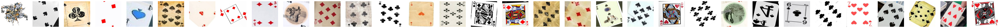

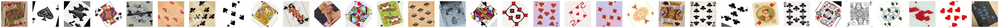

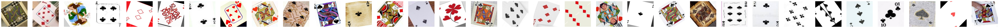

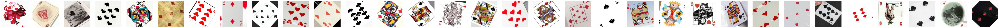

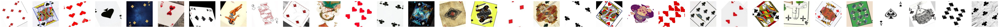

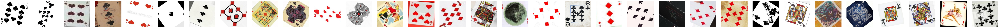

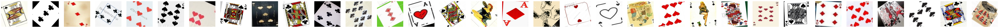

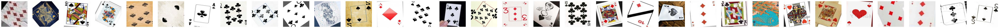

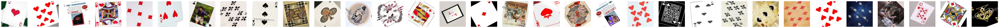

In [5]:
# Plot augmented images from a sample of 10 batches
for batch_index in range(1,10):
    image_batch, label_batch = next(train_generator)
    num_images_in_batch = image_batch.shape[0]

    plt.figure(figsize=(100, 8))
    for i in range(num_images_in_batch):
        plt.subplot(1, num_images_in_batch, i + 1)
        plt.imshow(image_batch[i].astype('uint8'))
        plt.axis('off')
    plt.show()

## Load, Preprocess, and Extract

In [47]:
# Load and preprocess the images
def load_and_preprocess_image(filepath):
    image = cv2.imread(filepath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    image = cv2.resize(image, (224, 224))
    return image

def convert_to_grayscale(images):
    gray_images = np.array([cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in images])
    gray_images_scaled = np.array([ (( img - np.min(img) ) / (np.max(img) - np.min(img))) for img in gray_images ] )
#     gray_images = gray_images.astype(np.uint8)
    return gray_images_scaled

# Extract HOG feature vectors
def extract_lbp_features(images,radius, n_points):
    lbp_features = []
    for image in images:
        lbp_feature = local_binary_pattern(image, n_points, radius, method='uniform')
        lbp_features.append(lbp_feature.flatten())
    return np.array(lbp_features)


In [57]:
# Load data from the generators
train_images = np.array([load_and_preprocess_image(train_generator.filepaths[i]) for i in range(len(train_generator.filenames))])
valid_images = np.array([load_and_preprocess_image(valid_generator.filepaths[j]) for j in range(len(valid_generator.filenames))])
test_images = np.array([load_and_preprocess_image(test_generator.filepaths[k]) for k in range(len(test_generator.filenames))])

# Convert to grayscale
train_gray_images = convert_to_grayscale(train_images)
valid_gray_images = convert_to_grayscale(valid_images)
test_gray_images = convert_to_grayscale(test_images)

# Extract HOG feature vectors from the grayscale images
train_lbp_features_gray = extract_lbp_features(train_gray_images, radius = 10, n_points = 10 * 4)
valid_lbp_features_gray = extract_lbp_features(valid_gray_images, radius = 10, n_points = 10 * 4)
test_lbp_features_gray = extract_lbp_features(test_gray_images, radius = 10, n_points = 10 * 4)


In [58]:
# Use LabelEncoder to convert string labels to integer values
label_encoder = LabelEncoder()
train_labels = label_encoder.fit_transform(train_df['suit'])
valid_labels = label_encoder.transform(val_df['suit'])
test_labels = label_encoder.transform(test_df['suit'])

# Convert labels to arrays and one-hot encode 
train_labels = to_categorical(train_labels, num_classes=4)
valid_labels = to_categorical(valid_labels, num_classes=4)
test_labels = to_categorical(test_labels, num_classes=4)

## CNN Model

In [59]:
# SVM using the train HOG features
num_classes = 4

model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(train_lbp_features_gray.shape[1],)))
# # model.add(Dropout(0.05))
# model.add(Dense(128, activation='relu'))
# # model.add(Dropout(0.05))
# model.add(Dense(64, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))

model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 128)               6422656   
                                                                 
 dense_11 (Dense)            (None, 4)                 516       
                                                                 
Total params: 6,423,172
Trainable params: 6,423,172
Non-trainable params: 0
_________________________________________________________________


In [60]:
# Train the CNN model
history = model.fit(train_lbp_features_gray, train_labels,
                    batch_size=32,
                    epochs=10,
                    validation_data=(valid_lbp_features_gray, valid_labels))


Epoch 1/10
161/161 [==============================] - 16s 92ms/step - loss: 58.0833 - accuracy: 0.2565 - val_loss: 108.2477 - val_accuracy: 0.2732
Epoch 2/10
161/161 [==============================] - 29s 178ms/step - loss: 35.2511 - accuracy: 0.2857 - val_loss: 20.6233 - val_accuracy: 0.2763
Epoch 3/10
161/161 [==============================] - 15s 95ms/step - loss: 32.6926 - accuracy: 0.2921 - val_loss: 38.5469 - val_accuracy: 0.2646
Epoch 4/10
161/161 [==============================] - 15s 93ms/step - loss: 17.4644 - accuracy: 0.3435 - val_loss: 18.2127 - val_accuracy: 0.2646
Epoch 5/10
161/161 [==============================] - 30s 188ms/step - loss: 23.0353 - accuracy: 0.3550 - val_loss: 23.5175 - val_accuracy: 0.2669
Epoch 6/10
161/161 [==============================] - 16s 100ms/step - loss: 16.8670 - accuracy: 0.3906 - val_loss: 41.3359 - val_accuracy: 0.2607
Epoch 7/10
161/161 [==============================] - 15s 93ms/step - loss: 25.2306 - accuracy: 0.3606 - val_loss: 25.40

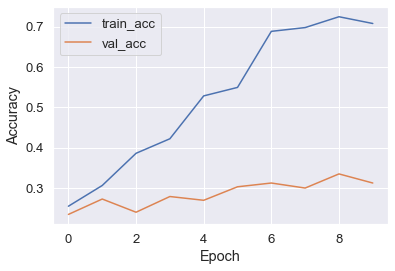

In [52]:
# Plot accuracy
plt.plot(history.history['accuracy'], label='train_acc')
plt.plot(history.history['val_accuracy'], label='val_acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

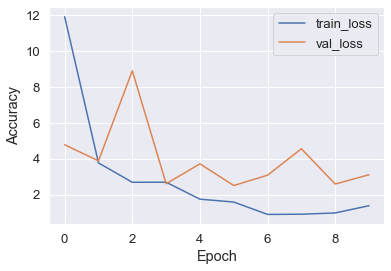

In [53]:
#Plot Loss
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [54]:
# Make predictions on the validation set
valid_predictions_probs = model.predict(valid_lbp_features_gray)
valid_predictions = np.argmax(valid_predictions_probs, axis=1)
valid_labels_multiclass = np.argmax(valid_labels, axis=1)

# Calculate validation accuracy
valid_accuracy = accuracy_score(valid_labels_multiclass, valid_predictions)
print("Validation Accuracy:", valid_accuracy)

# Make predictions on the test set
test_predictions_probs = model.predict(test_lbp_features_gray)
test_predictions = np.argmax(test_predictions_probs, axis=1)

# Calculate test accuracy
test_accuracy = accuracy_score(test_generator.labels, test_predictions)
print("Test Accuracy:", test_accuracy)

41/41 [==============================] - 1s 12ms/step
Validation Accuracy: 0.3120622568093385
51/51 [==============================] - 1s 12ms/step
Test Accuracy: 0.31444582814445826


In [55]:
# Get the class names from the generator (assuming it has the 'class_indices' attribute)
class_names = list(test_generator.class_indices.keys())

# Calculate classification report for validation set
valid_report = classification_report(valid_generator.labels, valid_predictions, target_names=class_names)
print("Validation Classification Report:\n", valid_report)

# Calculate classification report for test set
test_report = classification_report(test_generator.labels, test_predictions, target_names=class_names)
print("Test Classification Report:\n", test_report)

Validation Classification Report:
               precision    recall  f1-score   support

       clubs       0.27      0.25      0.26       310
    diamonds       0.26      0.05      0.09       313
      hearts       0.46      0.18      0.26       316
      spades       0.31      0.72      0.43       346

    accuracy                           0.31      1285
   macro avg       0.32      0.30      0.26      1285
weighted avg       0.32      0.31      0.26      1285

Test Classification Report:
               precision    recall  f1-score   support

       clubs       0.30      0.29      0.29       387
    diamonds       0.31      0.09      0.14       392
      hearts       0.45      0.18      0.26       395
      spades       0.30      0.66      0.41       432

    accuracy                           0.31      1606
   macro avg       0.34      0.31      0.28      1606
weighted avg       0.34      0.31      0.28      1606



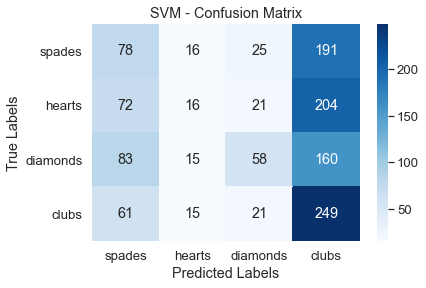

In [56]:
conf_matrix = confusion_matrix(valid_labels_multiclass, valid_predictions)

# Define the class labels
class_labels = ['spades', 'hearts', 'diamonds', 'clubs']

# Create the seaborn heatmap
sns.set(font_scale=1.2)
sns.heatmap(conf_matrix, 
            annot=True, 
            fmt="d", 
            cmap="Blues", 
            xticklabels=class_labels, 
            yticklabels=class_labels)

# Add labels and title
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("SVM - Confusion Matrix")

# Show the plot
plt.show()

## Sample Images

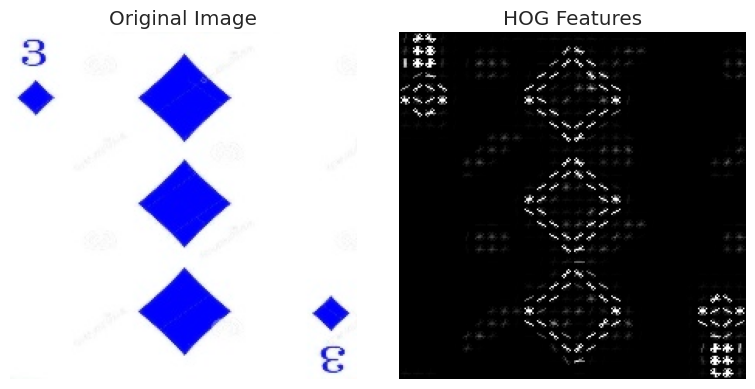

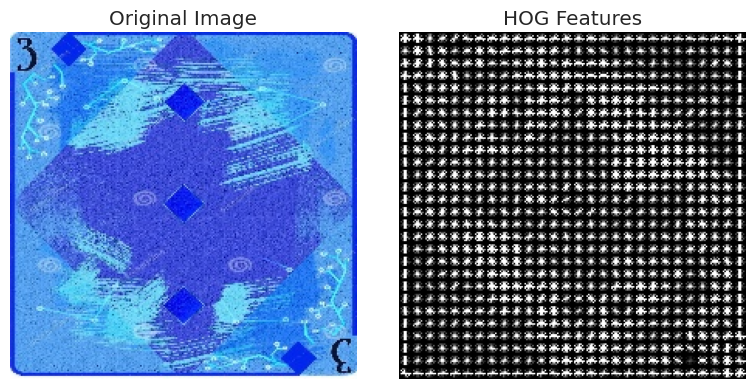

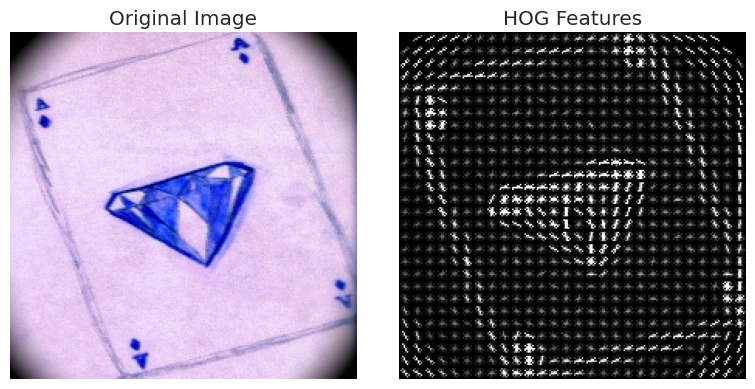

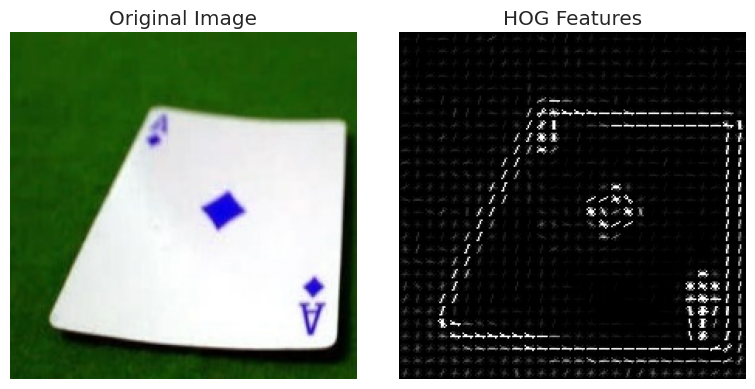

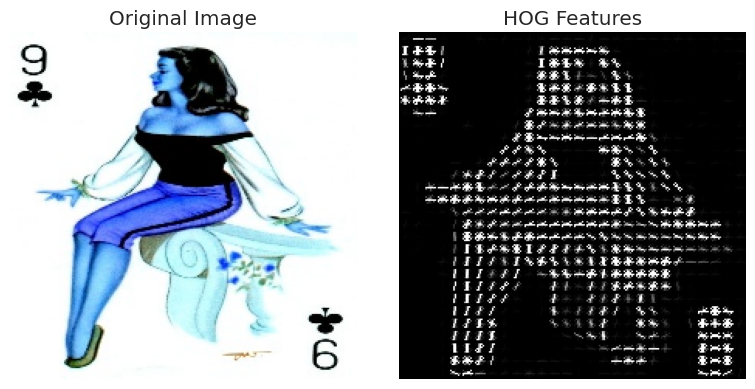

...

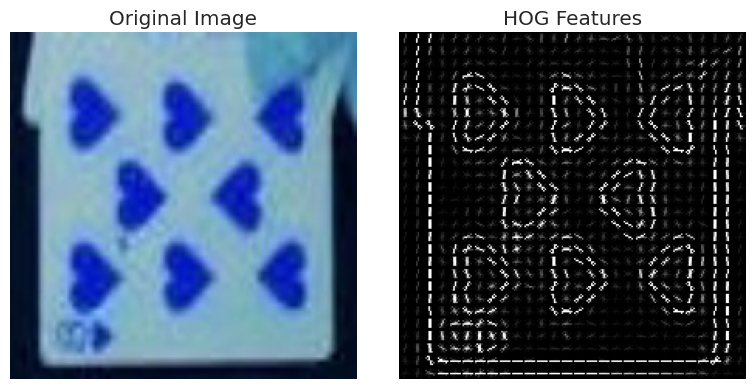

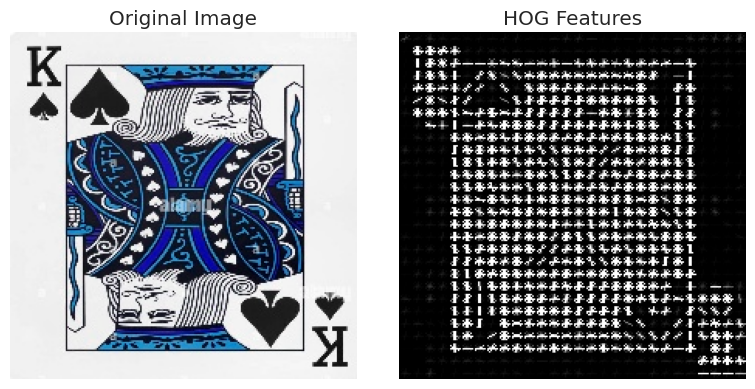

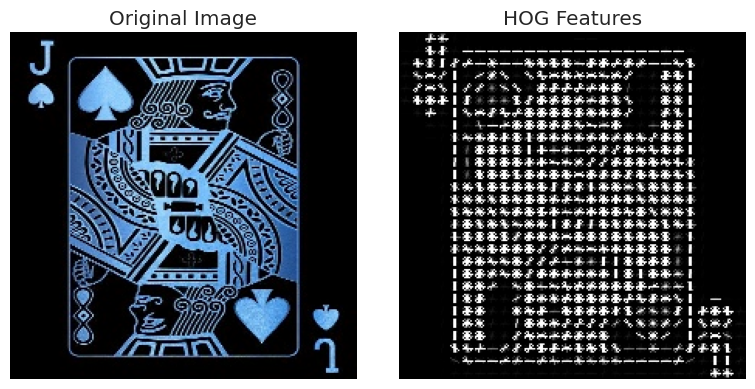

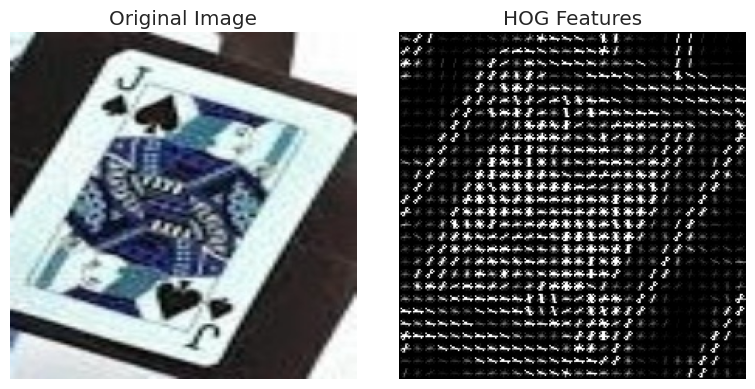

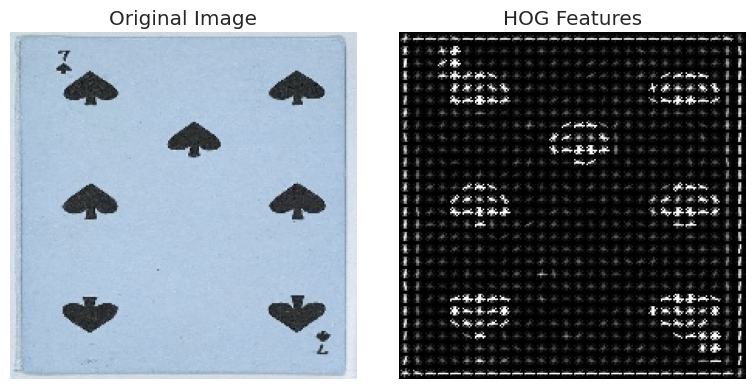

In [16]:
sample_filepaths = [
    'Dataset/train/three of diamonds/006.jpg',
    'Dataset/train/three of diamonds/002.jpg',
    'Dataset/train/ace of diamonds/064.jpg',
    'Dataset/train/ace of diamonds/063.jpg',
    'Dataset/train/nine of clubs/024.jpg',
    'Dataset/train/nine of clubs/070.jpg',
    'Dataset/train/ace of clubs/066.jpg',
    'Dataset/train/ace of clubs/047.jpg',
    'Dataset/train/queen of hearts/005.jpg',
    'Dataset/train/three of hearts/056.jpg',
    'Dataset/train/two of hearts/033.jpg',
    'Dataset/train/eight of hearts/100.jpg',
    'Dataset/train/king of spades/005.jpg',
    'Dataset/train/jack of spades/014.jpg',
    'Dataset/train/jack of spades/055.jpg',
    'Dataset/train/seven of spades/055.jpg'
]

# Load and preprocess the sample images
sample_images = np.array([load_and_preprocess_image(filepath) for filepath in sample_filepaths])

# Convert the images to grayscale
sample_gray_images = convert_to_grayscale(sample_images)

# Extract HOG features for the sample images
sample_hog_features = extract_hog_features(sample_gray_images)

# Calculate the number of images
num_images = len(sample_images)

for i in range(num_images):
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))

    ax[0].imshow(sample_images[i], cmap='gray')
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    hog_image = hog(sample_gray_images[i], pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)[1]
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    ax[1].imshow(hog_image_rescaled, cmap='gray')
    ax[1].set_title('HOG Features')
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()


## PCA

In [ ]:
# Perform PCA on the HOG features.
pca = PCA()
hog_features_pca = pca.fit_transform(train_hog_features_combined)

# Cumulative explained variance.
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Determine the number of principal components to plot with increments of 100.
num_components = hog_features_pca.shape[1]
components_range = np.arange(1, num_components + 1, 100)

plt.figure(figsize=(12, 6))
plt.plot(components_range, cumulative_explained_variance[components_range - 1], marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA - Cumulative Explained Variance')
plt.xticks(components_range, fontsize=6)
plt.grid(True)
plt.show()